In [1]:
from pathlib import Path

import cv2 as cv
import os.path as op
import matplotlib.pyplot as plt
import numpy as np
import math
from tqdm import tqdm

In [2]:
data_pth = op.join("images", "parrington")
focal_filename = "focal.txt"
img_set = []
focal_set = []
cy_img_set = []

In [3]:
def imshow(img, cmap=None):
    plt.imshow(img, cmap)
    plt.show()

In [4]:
focal_set.clear()
with open(op.join(data_pth, focal_filename), "r") as f:
    for line in f.readlines():
        f = float(line.rstrip('\n'))
        focal_set.append(f)

images\parrington\prtn00.jpg


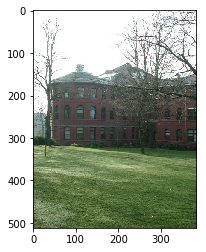

images\parrington\prtn01.jpg


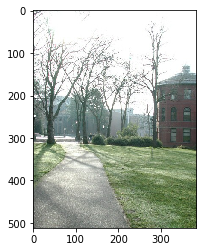

images\parrington\prtn02.jpg


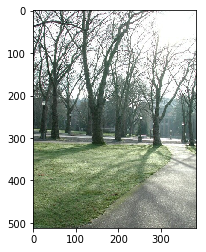

images\parrington\prtn03.jpg


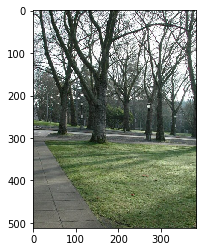

images\parrington\prtn04.jpg


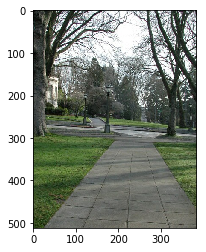

images\parrington\prtn05.jpg


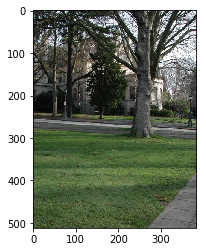

images\parrington\prtn06.jpg


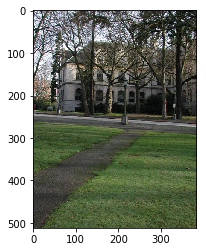

images\parrington\prtn07.jpg


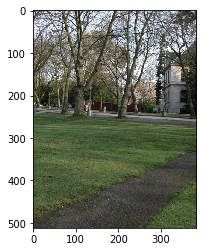

images\parrington\prtn08.jpg


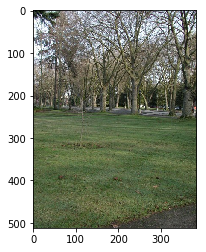

images\parrington\prtn09.jpg


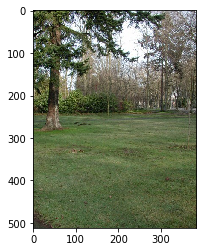

images\parrington\prtn10.jpg


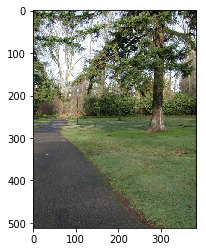

images\parrington\prtn11.jpg


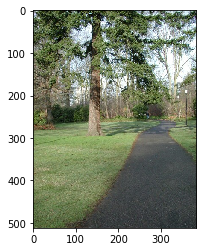

images\parrington\prtn12.jpg


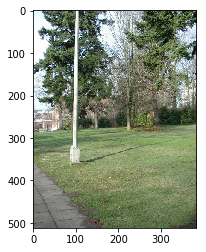

images\parrington\prtn13.jpg


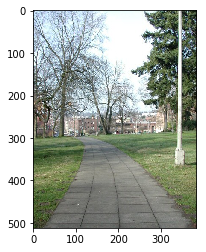

images\parrington\prtn14.jpg


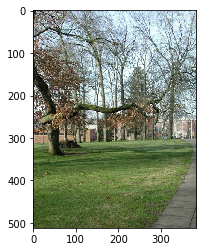

images\parrington\prtn15.jpg


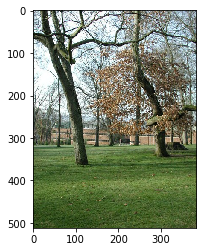

images\parrington\prtn16.jpg


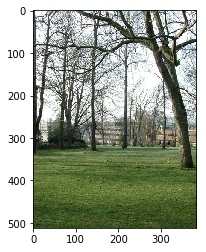

images\parrington\prtn17.jpg


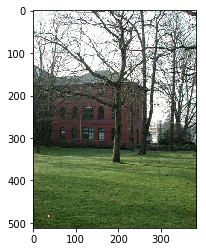

In [5]:
img_set.clear()
for img_pth in sorted(Path(data_pth).glob(f'prtn*.jpg')):
    print(img_pth)
    img = cv.imread(op.join(img_pth))
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    imshow(img)
    img_set.append(img)

In [6]:
# to cylindrical coordinate
cy_img_set.clear()
for i, img in enumerate(img_set):
    f = focal_set[i]
    cy_img = np.zeros_like(img)
    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            y_tmp = int(y - img.shape[0] / 2)
            x_tmp = int(x - img.shape[1] / 2)
            y_p = int(round(f * y_tmp / math.sqrt(x_tmp**2 + f**2)) + img.shape[0] / 2)
            x_p = int(round(f * math.atan(x_tmp/f)) + img.shape[1] / 2)
            cy_img[y_p][x_p] = img[y][x]
    #imshow(cy_img)
    # 5~-5 is to cancel the black boader, however, it should be calculate precisely by f and x above
    # Here is for convinent
    img_t = cy_img[:, 5:-5, :]
    img_t = cv.copyMakeBorder(img_t, 60, 0, 0, 0, cv.BORDER_CONSTANT, value=[0, 0, 0])
    cy_img_set.append(img_t)

In [7]:
def feature_extraction(img):
    # feature extraction with library SIFT
    # Initiate SIFT detector
    sift = cv.xfeatures2d.SIFT_create()

    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(img,None)
    return kp1, des1

In [8]:
def feature_matching(img1, img2, kp1, kp2, des1, de2):
    def take_last(elem):
        return elem[-1]
    def distance(p1, p2):
        return math.sqrt( ((p1[0]-p2[0])**2)+((p1[1]-p2[1])**2) )
    n_compare_pts = 0
    compared_threshold = 1500
    kp_candidate = []
    for i, des in enumerate(des1):
        candidate_pt = []
        # Ignore the boarder
        if kp1[i].pt[0] < 10 or kp1[i].pt[0] > img1.shape[1] - 10 or kp1[i].pt[1] < 10 or kp1[i].pt[1] > img1.shape[0] - 10:
            continue
        for j, des_compare in enumerate(des2):
            # Ignore the boarder
            if kp2[j].pt[0] < 10 or kp2[j].pt[0] > img2.shape[1] - 10 or kp2[j].pt[1] < 10 or kp2[j].pt[1] > img2.shape[0] - 10:
                continue
            if sum(abs(des-des_compare)) < compared_threshold:
                candidate_pt.append([kp1[i], kp2[j], sum(abs(des-des_compare))])
        if len(candidate_pt) > 0:
            n_compare_pts += 1
            # if more than one: sorted to get the best one
            if(len(candidate_pt) > 1):
                candidate_pt.sort(key=take_last)
            kp_in_img1, kp_in_img2, _ = candidate_pt[0]
            kp_candidate.append([kp_in_img1, kp_in_img2])
    print("Compared candidate found with pairs:", n_compare_pts)

    approve_vote = 0
    max_approve_vote = 0
    candidate_index = -1
    for i, (kp_1, kp_2) in enumerate(kp_candidate):
        #print(kp_1.pt, kp_2.pt)
        x_translate = kp_1.pt[0] - kp_2.pt[0]
        y_translate = kp_1.pt[1] - kp_2.pt[1]
        #print(x_translate, y_translate)
        approve_vote = 0
        for kp_1_tmp, kp_2_tmp in kp_candidate:
            kp2_2_kp1 = (kp_2_tmp.pt[0] + x_translate, kp_2_tmp.pt[1] + y_translate)
            if distance(kp_1_tmp.pt, kp2_2_kp1) < 5:
                approve_vote += 1
        if max_approve_vote < approve_vote:
            max_approve_vote = approve_vote
            candidate_index = i
    ransac_pt_list = []
    kp_1, kp_2 = kp_candidate[candidate_index]
    x_translate = kp_1.pt[0] - kp_2.pt[0]
    y_translate = kp_1.pt[1] - kp_2.pt[1]
    img1_ft = np.copy(img1)
    img2_ft = np.copy(img2)
    for kp_1_tmp, kp_2_tmp in kp_candidate:
        kp2_2_kp1 = (kp_2_tmp.pt[0] + x_translate, kp_2_tmp.pt[1] + y_translate)
        if distance(kp_1_tmp.pt, kp2_2_kp1) < 5:
            ransac_pt_list.append([kp_1_tmp, kp_2_tmp])
            cv.circle(img1_ft, (round(kp_1_tmp.pt[0]), round(kp_1_tmp.pt[1])), 5, (255, 0, 0), -1)
            cv.circle(img2_ft, (round(kp_2_tmp.pt[0]), round(kp_2_tmp.pt[1])), 5, (255, 0, 0), -1)
    imshow(img1_ft)
    imshow(img2_ft)
    print(len(ransac_pt_list))
    return (x_translate, y_translate)

In [30]:
def image_concatenate(img1, img2, global_translate, shifted_y=0):
    img_t1 = np.copy(img1)
    img_t2 = np.copy(img2)
    #imshow(img_t1)
    #imshow(img_t2)
    print(global_translate, round(global_translate[0]), round(global_translate[1]))
    if round(global_translate[0]) < 0:
        shifted_x = abs(round(global_translate[0]))
        shifted_y = round(global_translate[1]) + shifted_y
        M = np.float32([[1, 0, 0], [0, 1, shifted_y]])
        img_t2 = cv.warpAffine(img_t2, M, (img_t2.shape[1], img_t2.shape[0]))
        img_cat = cv.copyMakeBorder(img_t1, 0, 0, shifted_x, 0, cv.BORDER_CONSTANT, value=[0, 0, 0])
        middle_length = img_t2.shape[1] - shifted_x
        #print(img_t1.shape, img_t2.shape, img_cat.shape, shifted_x)
        #print(middle_length)
        # Blending with alpha ratio
        for y in range(img_cat.shape[0]):
            for x in range(img_cat.shape[1]):
                if x < shifted_x:
                    img_cat[y][x] = img_t2[y][x]
                elif x > shifted_x and x < shifted_x + middle_length:
                    ratio = (x - shifted_x) / middle_length
                    # closer -> heavier
                    img_cat[y][x] = ratio * img_t1[y][x-shifted_x] + (1 - ratio) * img_t2[y][x]
                else:
                    img_cat[y][x] = img_t1[y][x-shifted_x]
    else:
        shifted_x = img_t1.shape[0] - (img_t2.shape[0] - abs(round(global_translate[0])))
        img_t1 = np.copy(img_t1[:, :shifted_x, :])
        # increase with more than one image
        shifted_y = round(global_translate[1]) + shifted_y
        M = np.float32([[1, 0, 0], [0, 1, shifted_y]])
        shifted_img_t2 = cv.warpAffine(img_t2, M, (img_t2.shape[1], img_t2.shape[0]))
        img_cat = np.concatenate((img_t1, shifted_img_t2), axis=1)
    imshow(img_cat)
    return img_cat, shifted_y

Compared candidate found with pairs:228


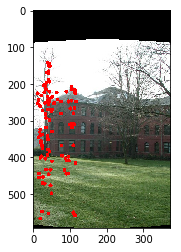

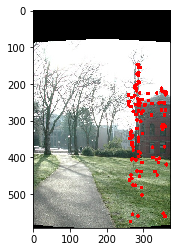

126
(-244.5964241027832, -4.169921875)-245-4


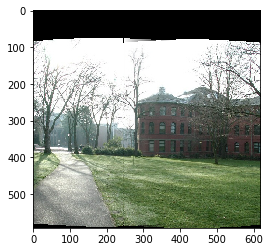

Compared candidate found with pairs:321


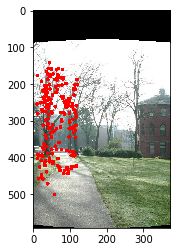

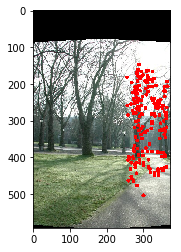

199
(-244.60887622833252, -3.24658203125)-245-3


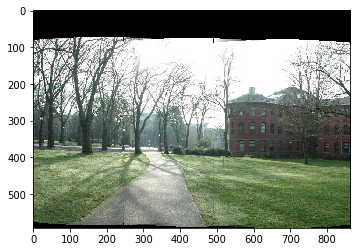

Compared candidate found with pairs:466


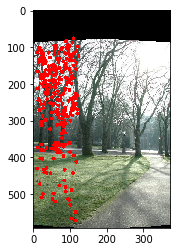

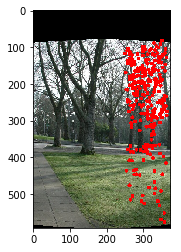

308
(-240.54450225830078, -3.574920654296875)-241-4


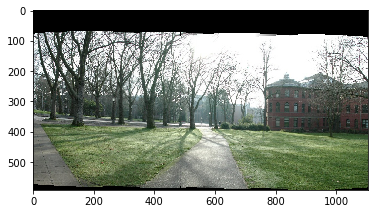

Compared candidate found with pairs:370


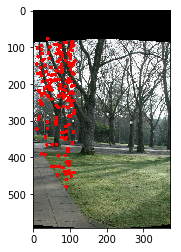

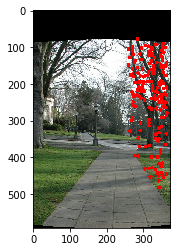

184
(-248.13467025756836, -3.4979934692382812)-248-3


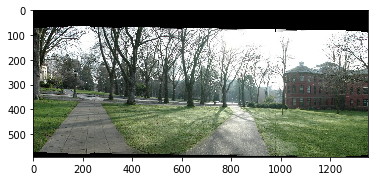

Compared candidate found with pairs:324


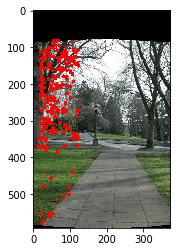

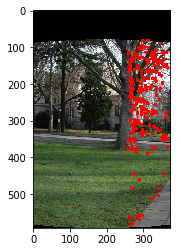

208
(-242.40932083129883, -2.5035629272460938)-242-3


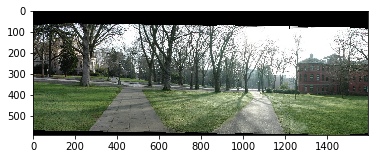

Compared candidate found with pairs:236


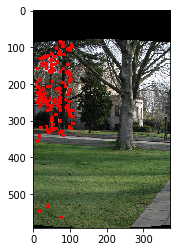

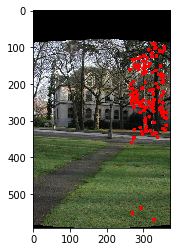

140
(-251.26555824279785, -3.9737701416015625)-251-4


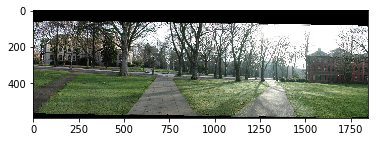

Compared candidate found with pairs:267


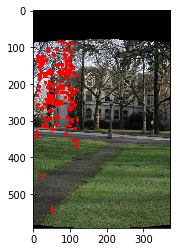

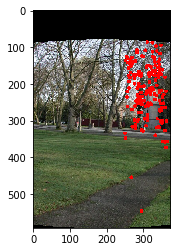

182
(-241.45154190063477, -2.5082244873046875)-241-3


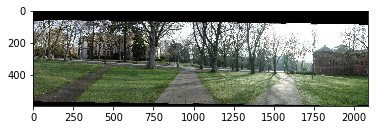

Compared candidate found with pairs:226


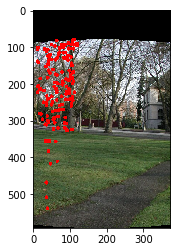

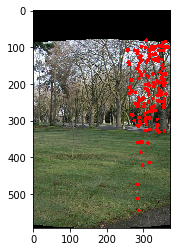

162
(-245.89850616455078, -3.326202392578125)-246-3


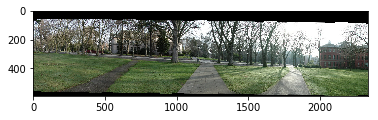

Compared candidate found with pairs:187


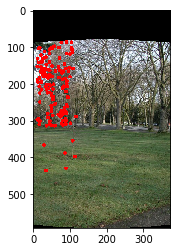

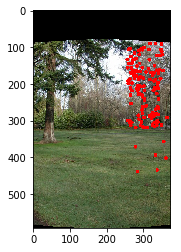

149
(-244.363844871521, -3.0172271728515625)-244-3


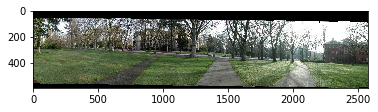

Compared candidate found with pairs:199


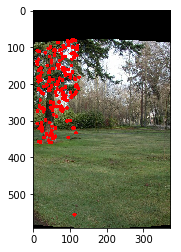

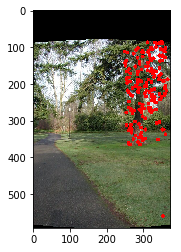

184
(-238.86523342132568, -3.3571929931640625)-239-3


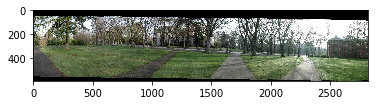

Compared candidate found with pairs:152


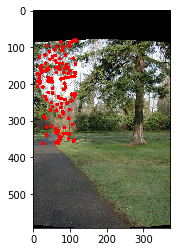

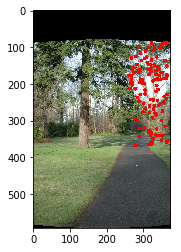

132
(-248.1780948638916, -3.3175735473632812)-248-3


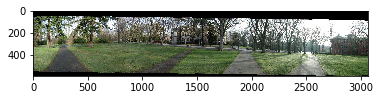

Compared candidate found with pairs:189


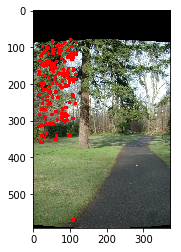

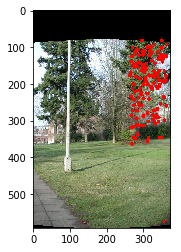

159
(-245.94165802001953, -2.3318252563476562)-246-2


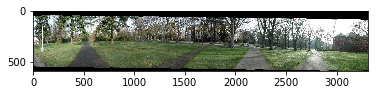

Compared candidate found with pairs:331


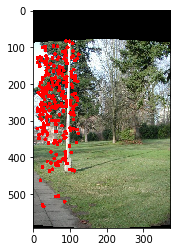

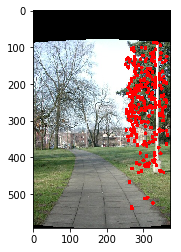

260
(-241.54071044921875, -3.950958251953125)-242-4


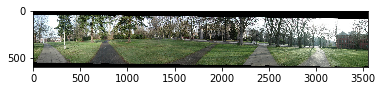

Compared candidate found with pairs:232


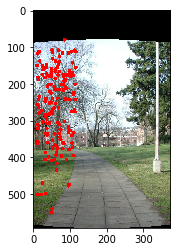

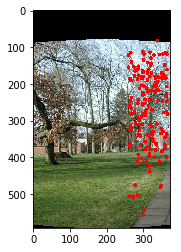

164
(-248.41377353668213, -4.26239013671875)-248-4


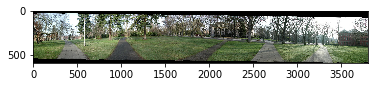

Compared candidate found with pairs:351


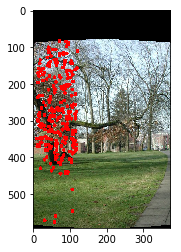

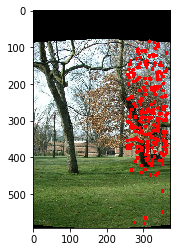

263
(-243.77507495880127, -4.1137847900390625)-244-4


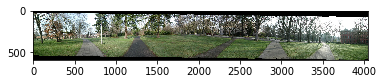

Compared candidate found with pairs:338


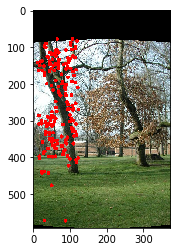

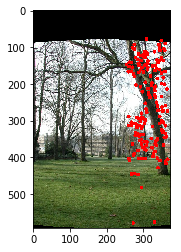

195
(-240.4100685119629, -3.51239013671875)-240-4


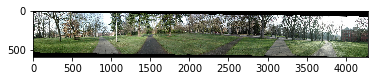

Compared candidate found with pairs:453


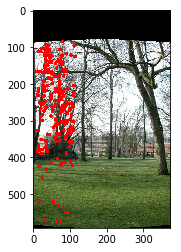

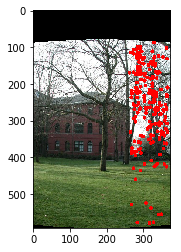

229
(-250.95652103424072, -3.8356781005859375)-251-4


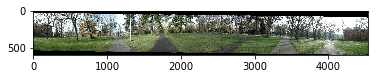

In [31]:
for i, img in enumerate(cy_img_set):
    if i == len(cy_img_set) - 1:
        break
    img_compared = cy_img_set[i+1]
    kp1, des1 = feature_extraction(img)
    kp2, des2 = feature_extraction(img_compared)
    global_translate = feature_matching(img, img_compared, kp1, kp2, des1, des2)
    if i == 0:
        img_cat = img
        shifted_y = 0
    img_cat, shifted_y = image_concatenate(img_cat, img_compared, global_translate, shifted_y)

In [33]:
img_cat_bgr = cv.cvtColor(img_cat, cv.COLOR_RGB2BGR)
cv.imwrite("pano1.jpg", img_cat_bgr)

True

-58(592, 4535, 3)


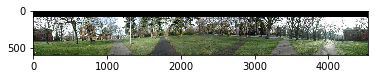

In [43]:
print(shifted_y, img_cat.shape)
img_cat_y_fix = np.copy(img_cat)
for x in range(img_cat.shape[1]-245):
    ratio = 1 - (x / (img_cat.shape[1]-245))
    y_offset = abs(round(ratio * shifted_y))
    for y in range(img_cat.shape[0]):
        #if y > img_cat.shape[0] - y_offset: break
        if y < y_offset:
            img_cat_y_fix[y][x] = [0, 0, 0]
        elif y >= y_offset:
            img_cat_y_fix[y][x] = img_cat[y-y_offset][x]
imshow(img_cat_y_fix)

In [44]:
img_cat_bgr = cv.cvtColor(img_cat_y_fix, cv.COLOR_RGB2BGR)
cv.imwrite("pano1_y.jpg", img_cat_bgr)

True